In [1]:
import pandas as pd
import numpy as np
import string as s
import seaborn as sns
import math
import tables
import matplotlib
import matplotlib.pyplot as plt
from scipy.ndimage.interpolation import shift
# matplotlib.style.use('ggplot')
# %matplotlib inline
matplotlib.rcParams['figure.figsize'] = (12, 6)
# matplotlib.rcParams['figure.facecolor'] = 'white'


In [36]:
f1 = '/projects/trans_scratch/validations/workspace/szong/Cervical/variant_bwamem/107_patients/all_107_patients_vcf.txt'
df1 = pd.read_csv(f1, sep='\t', index_col='patient',usecols=['patient', 'strelka_snv_vcf', 'strelka_indel_vcf'])
# remove normals
df1 = df1[~df1.strelka_snv_vcf.isnull()]
df1.head(2)

,strelka_snv_vcf,strelka_indel_vcf
patient,,
HTMCP-03-06-02001,/projects/somatic/NCI_SAIC_HIV_Cervical/HTMCP-...,/projects/somatic/NCI_SAIC_HIV_Cervical/HTMCP-...
HTMCP-03-06-02002,/projects/somatic/NCI_SAIC_HIV_Cervical/HTMCP-...,/projects/somatic/NCI_SAIC_HIV_Cervical/HTMCP-...


In [37]:
# strelka annotations:
# DOWNSTREAM
# EXON
# INTERGENIC
# INTRAGENIC
# INTRON
# NON_SYNONYMOUS_CODING
# START_GAINED
# START_LOST
# STOP_GAINED
# STOP_LOST
# SYNONYMOUS_CODING
# UPSTREAM
# UTR_3_PRIME
# UTR_5_PRIME

In [38]:
coding_annts = ['EXON', 'NON_SYNONYMOUS_CODING', 
                'START_GAINED', 'START_LOST', 
                'STOP_GAINED', 'STOP_LOST', 
                'SYNONYMOUS_CODING']

In [39]:
cdf = pd.DataFrame()
for index, row in df1.iterrows():
    indel = row.strelka_indel_vcf
    snv = row.strelka_snv_vcf
#     print(snv)
    df_snv = pd.read_csv(snv, sep='\t', comment='#', header=None)[[0,1,3,4,7]]
    df_indel = pd.read_csv(indel, sep='\t', comment='#', header=None)[[0,1,3,4,7]]
    tdf = pd.concat([df_snv, df_indel], axis=0)
#     tdf[8] = tdf[7].apply(lambda x: x.split('EFF=')[1].split('(')[0])
#     tdf = tdf.drop(7, axis=1)
#     look at all region first then focus on non-coding region
#     tdf = tdf.loc[~tdf[8].isin(coding_annts)]
    tdf.index = [index]*(tdf.shape[0])
    tdf.columns = ['chr', 'pos', 'ref', 'alt', 'eff']

    if cdf.empty:
         cdf = tdf
    else:
        cdf = pd.concat([cdf, tdf], axis=0)
cdf.head()

/home/szong/anaconda3/lib/python3.6/site-packages/IPython/core/interactiveshell.py:2717: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,chr,pos,ref,alt,eff
HTMCP-03-06-02001,1,59734,A,G,NT=ref;QSS=33;QSS_NT=33;SGT=AA->AG;SOMATIC;TQS...
HTMCP-03-06-02001,1,694016,G,A,NT=ref;QSS=26;QSS_NT=26;SGT=GG->AG;SOMATIC;TQS...
HTMCP-03-06-02001,1,737454,G,C,NT=ref;QSS=28;QSS_NT=28;SGT=GG->CG;SOMATIC;TQS...
HTMCP-03-06-02001,1,757477,T,C,NT=ref;QSS=18;QSS_NT=18;SGT=TT->CT;SOMATIC;TQS...
HTMCP-03-06-02001,1,758253,G,A,NT=ref;QSS=16;QSS_NT=16;SGT=GG->AG;SOMATIC;TQS...


In [41]:
of = '/projects/trans_scratch/validations/workspace/szong/Cervical/hotspots/all_strelka_calls_107_patients.txt'
cdf.to_csv(of, sep='\t')

In [6]:
cdf.chr.unique()

array(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13',
       '14', '15', '16', '17', '18', '19', '20', '21', '22', 'X', 'MT',
       'GL000229.1', 'GL000231.1', 'GL000235.1', 'GL000247.1',
       'GL000234.1', 'GL000232.1', 'GL000240.1', 'GL000241.1',
       'GL000243.1', 'GL000230.1', 'GL000237.1', 'GL000233.1',
       'GL000198.1', 'GL000208.1', 'GL000191.1', 'GL000228.1',
       'GL000214.1', 'GL000221.1', 'GL000218.1', 'GL000220.1',
       'GL000213.1', 'GL000211.1', 'GL000199.1', 'GL000217.1',
       'GL000216.1', 'GL000205.1', 'GL000219.1', 'GL000224.1',
       'GL000195.1', 'GL000193.1', 'GL000194.1', 'GL000225.1',
       'GL000192.1', 'GL000226.1', 'GL000212.1', 'GL000222.1',
       'GL000246.1', 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 'GL000207.1', 'GL000239.1', 'GL000203.1',
       'GL000248.1', 'GL000244.1', 'GL000238.1', 'GL000202.1',
       'GL000204.1', 'GL000209.1', 'GL000245.1'], dtype=object)

In [7]:
cdf['chr'] = cdf['chr'].astype(str)

In [137]:
chromosomes = [str(i) for i in np.arange(1,23)] + ['X']

In [9]:
ddf = cdf[cdf.chr.isin(chromosomes)]
ddf.shape

(6481073, 5)

In [10]:
nmutations = ddf.groupby('chr').count()['pos'].to_frame()

In [11]:
# nmutations

In [12]:
f2 = '/home/szong/projects/resource/chrominfo.txt'
df2 = pd.read_csv(f2, sep='\t', usecols=['#chrom', 'size'])
df2.head(2)

,#chrom,size
0,chr1,249250621
1,chr2,243199373


In [13]:
df2['chr'] = df2['#chrom'].apply(lambda x: x.replace('chr', ''))
df2 = df2.set_index('chr').drop('#chrom', axis=1)
df2.head(2)

,size
chr,
1,249250621
2,243199373


In [14]:
# df2

In [15]:
mdf = pd.merge(nmutations, df2, left_index=True, right_index=True)

In [16]:
mdf['mut_rate'] = mdf.pos/mdf['size']*1000000
mdf = mdf.sort_values('mut_rate', ascending=False)

In [17]:
mdf.head(2)
mdf.rename(columns={'pos':'num_mutations'}, inplace=True)

In [18]:
of2 = '/projects/trans_scratch/validations/workspace/szong/Cervical/hotspots/107_pats_mut_rate.txt'
# mdf.to_csv(of2)

In [19]:
mdf.head()

,num_mutations,size,mut_rate
chr,,,
X,458892,155270560,2955.434694
18,200738,78077248,2571.017872
4,455534,191154276,2383.069893
8,347631,146364022,2375.112376
5,428651,180915260,2369.346842


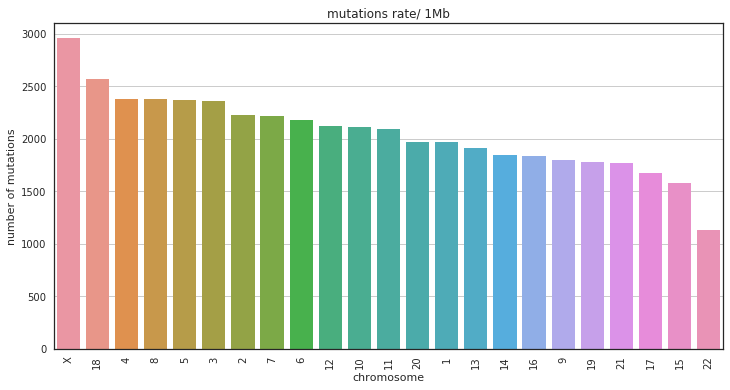

In [20]:
# look at general mutation rate

with plt.style.context("seaborn-whitegrid"):
    plt.rcParams["axes.edgecolor"] = "0.15"
    plt.rcParams["axes.linewidth"]  = 1.25
    fig = plt.figure(facecolor='w')
    p = sns.barplot(mdf.index, 'mut_rate', data = mdf)#, ci=None)
    _ = plt.setp(p.get_xticklabels(), rotation=90)
    _ = plt.title('mutations rate/ 1Mb')
    _ = plt.xlabel('chromosome')
    _ = plt.ylabel('number of mutations')
    pass
#     mdf['mut_rate'].plot(kind='bar', title='mutations/1Mb')
    of = '/projects/trans_scratch/validations/workspace/szong/Cervical/hotspots/average_mutation_rate_chromosome.png'
    plt.savefig(of, dpi=200)
    plt.show()
    plt.close()

In [21]:
cdf.head()

,chr,pos,ref,alt,eff
HTMCP-03-06-02001,1,59734,A,G,INTERGENIC
HTMCP-03-06-02001,1,694016,G,A,DOWNSTREAM
HTMCP-03-06-02001,1,737454,G,C,DOWNSTREAM
HTMCP-03-06-02001,1,757477,T,C,DOWNSTREAM
HTMCP-03-06-02001,1,758253,G,A,DOWNSTREAM


In [22]:
of = '/projects/trans_scratch/validations/workspace/szong/Cervical/hotspots/107_pats_all_strelka_mutations.txt'
# cdf = pd.read_csv(of, index_col=0)
# cdf.head()
# cdf.to_csv(of)

# sliding window analysis

In [2]:
# these are somatic non-coding mutation only, including all modifier events,eg. intergenic, intronic, utr, intragenic, downstream etc.
f1 = '/projects/trans_scratch/validations/workspace/szong/Cervical/hotspots/all_strelka_calls_minus_hml_107_patients.txt'
df1 = pd.read_csv(f1, sep='\t')
df1.head()

/home/szong/anaconda3/lib/python3.6/site-packages/IPython/core/interactiveshell.py:2717: DtypeWarning: Columns (1) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,Unnamed: 0,chr,pos,ref,alt,eff
0,HTMCP-03-06-02001,1,59734,A,G,NT=ref;QSS=33;QSS_NT=33;SGT=AA->AG;SOMATIC;TQS...
1,HTMCP-03-06-02001,1,694016,G,A,NT=ref;QSS=26;QSS_NT=26;SGT=GG->AG;SOMATIC;TQS...
2,HTMCP-03-06-02001,1,737454,G,C,NT=ref;QSS=28;QSS_NT=28;SGT=GG->CG;SOMATIC;TQS...
3,HTMCP-03-06-02001,1,757477,T,C,NT=ref;QSS=18;QSS_NT=18;SGT=TT->CT;SOMATIC;TQS...
4,HTMCP-03-06-02001,1,758253,G,A,NT=ref;QSS=16;QSS_NT=16;SGT=GG->AG;SOMATIC;TQS...


In [3]:
df1.set_index('Unnamed: 0', inplace=True)
del df1.index.name
df1.head()

,chr,pos,ref,alt,eff
HTMCP-03-06-02001,1,59734,A,G,NT=ref;QSS=33;QSS_NT=33;SGT=AA->AG;SOMATIC;TQS...
HTMCP-03-06-02001,1,694016,G,A,NT=ref;QSS=26;QSS_NT=26;SGT=GG->AG;SOMATIC;TQS...
HTMCP-03-06-02001,1,737454,G,C,NT=ref;QSS=28;QSS_NT=28;SGT=GG->CG;SOMATIC;TQS...
HTMCP-03-06-02001,1,757477,T,C,NT=ref;QSS=18;QSS_NT=18;SGT=TT->CT;SOMATIC;TQS...
HTMCP-03-06-02001,1,758253,G,A,NT=ref;QSS=16;QSS_NT=16;SGT=GG->AG;SOMATIC;TQS...


In [4]:
df1['eff'] = df1['eff'].apply(lambda x: x.split('EFF=')[1].split('(')[0])
df1.head()

,chr,pos,ref,alt,eff
HTMCP-03-06-02001,1,59734,A,G,INTERGENIC
HTMCP-03-06-02001,1,694016,G,A,DOWNSTREAM
HTMCP-03-06-02001,1,737454,G,C,DOWNSTREAM
HTMCP-03-06-02001,1,757477,T,C,DOWNSTREAM
HTMCP-03-06-02001,1,758253,G,A,DOWNSTREAM


In [5]:
cdf = df1.copy()

In [6]:
of2 = '/projects/trans_scratch/validations/workspace/szong/Cervical/hotspots/107_pats_mut_rate.txt'
mdf = pd.read_csv(of2, index_col='chr')

In [7]:
mdf.head(2)

,num_mutations,size,mut_rate
chr,,,
X,458892,155270560,2955.434694
18,200738,78077248,2571.017872


In [8]:
def merge_intervals(intervals):
    merged = []
    sorted_by_lower_bound = sorted(intervals, key=lambda lst: lst[0])
    for higher in sorted_by_lower_bound:
        if not merged:
            merged.append(higher)
        else:
            lower = merged[-1]
            # test for intersection between lower and higher:
            # we know via sorting that lower[0] <= higher[0]
            if higher[0] <= lower[1]+1:            
                upper_bound = max(lower[1], higher[1])
                merged[-1] = [lower[0], upper_bound]  # replace by merged interval
            else:
                merged.append(higher)
    return merged

In [10]:
def windowsum(arr, wsize, stride, avg_mrate, chrm, mfold):
    if chrm == 'X':
        chrm = '23'
    if chrm == 'Y':
        chrm = '24'
    arr_len = arr.shape[0]
    wnum = math.ceil((arr_len - wsize + 1)/stride)
    idxs = np.arange(wsize)[None,:] + stride*np.arange(wnum)[:, None]
    # ignored last window with insufficient element
    if idxs.max() > arr_len:
        idxs = idxs[:-1]
    b = arr[idxs]
    nmuts = np.sum(b, axis=1)
    rate = 1000000*nmuts/wsize
#     pick windows with mutation rate more than 2xaverage mut rate
    spots = idxs[np.where(rate > mfold*avg_mrate)[0]][:,[0,-1]]
    nws = len(spots)


    if nws > 0:            
        merged_spots = merge_intervals(spots)
        merged_spots = np.hstack (([[chrm]] * len(merged_spots), merged_spots))
#     print(merged_spots)
    return [nmuts, merged_spots]

In [11]:
a = np.array([1,0,2,3,1,2,0,0,1,2])
assert all(windowsum(a, 5, 2, 0.35*1000000, 1, 2)[0] == np.array([7,8,4]))

# f11 = 'a.test'
# np.savetxt(f11, windowsum(a, 5, 2, 0.35*1000000, 1)[1], delimiter="\t", fmt='%10.0f')

In [82]:
mfold = 5
wsize = 2000
stride = 200

In [83]:
# NUM_COLS = 3
# NUM_ROWS = 10000000
fn = 'windowsize_{0}_stride_{1}_threshold_{2}x_mutation_rate.h5.repeat'.format(wsize, stride, mfold)
# fh = tables.open_file(fn, mode='w')
# atom = tables.Int64Atom()
# array_c = fh.create_earray(fh.root, 'data', atom, (0, NUM_COLS))
# fh.close()

In [17]:
# qdf.pos.value_counts().sort_index()


In [98]:
# locate window number for centromere
f2 = '/home/szong/projects/resource/centromere.pos.txt'
df2 = pd.read_csv(f2, sep='\t')
df2.head()

,chr,start,end,arm,annot
0,1,121100000,124300000,p11.1,acen
1,1,124300000,128000000,q11,acen
2,10,38800000,40300000,p11.1,acen
3,10,40300000,42100000,q11.1,acen
4,11,51400000,52900000,p11.11,acen


In [15]:
def determine_centwin(df, chrm, wsize, stride, chrm_len):
    if chrm == 'X':
        chrm = '23'
    if chrm == 'Y':
        chrm = '24'
    dftmp = (df.query('chr == "{}"'.format(chrm))[['start', 'end']])
    cen_start = dftmp.min().min()
    cen_end = dftmp.max().max()
    wnum = math.ceil((chrm_len - wsize + 1)/stride)
    idxs = np.arange(wsize)[None,:] + stride*np.arange(wnum)[:, None]
#     if cen_start in idxs
#     print(wnum, idxs)
    for i, win in enumerate(idxs):
        if cen_start in win:
            winstart = i
        if cen_end in win:
            winend = i
#     print(winstart, winend)
    return [winstart, winend]


In [16]:
assert(determine_centwin(df2, 99, 3, 2, 30) == [6,9])

In [22]:
%time cdf.to_csv('/dev/shm/a.csv', index=False)

CPU times: user 10.5 s, sys: 218 ms, total: 10.7 s
Wall time: 10.7 s


In [23]:
%time cdf.to_hdf('/dev/shm/a.h5', key='cdf')

CPU times: user 6.3 s, sys: 681 ms, total: 6.98 s
Wall time: 6.96 s


/home/szong/anaconda3/lib/python3.6/site-packages/pandas/core/generic.py:1282: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block1_values] [items->['chr', 'ref', 'alt', 'eff']]

  return pytables.to_hdf(path_or_buf, key, self, **kwargs)


In [25]:
%time cdf.to_pickle('/dev/shm/a.pkl')

CPU times: user 3.23 s, sys: 438 ms, total: 3.67 s
Wall time: 3.64 s


processing chromosome: 1
CPU times: user 18.5 s, sys: 10.2 s, total: 28.7 s
Wall time: 28.7 s


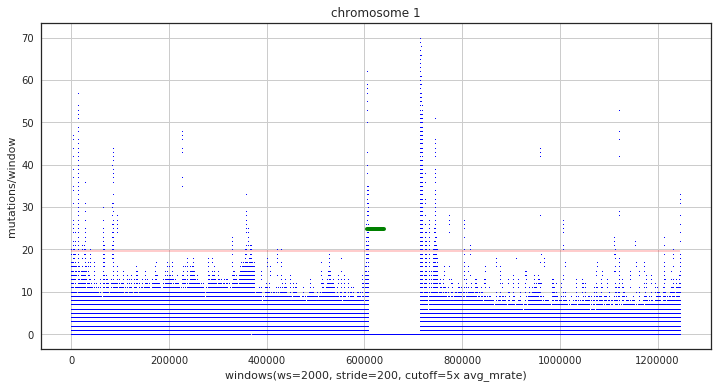

processing chromosome: 2
CPU times: user 18.8 s, sys: 10 s, total: 28.8 s
Wall time: 28.8 s


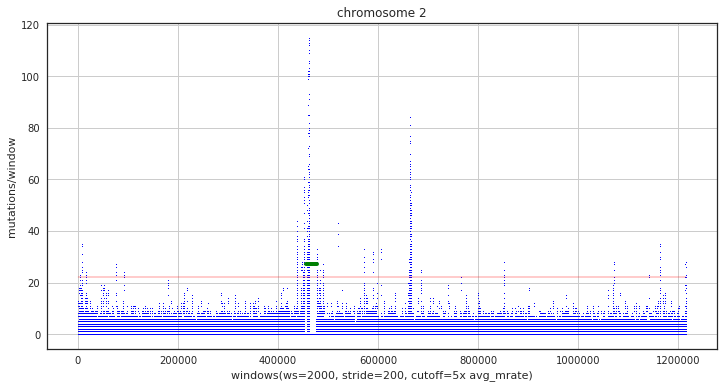

processing chromosome: 3
CPU times: user 14.5 s, sys: 8.39 s, total: 22.9 s
Wall time: 22.9 s


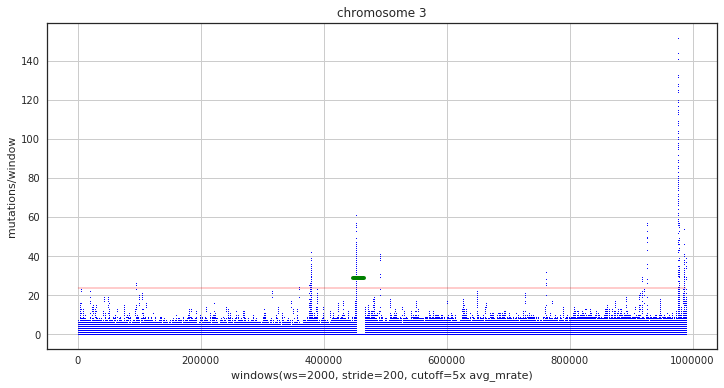

processing chromosome: 4
CPU times: user 14.3 s, sys: 8.05 s, total: 22.3 s
Wall time: 22.3 s


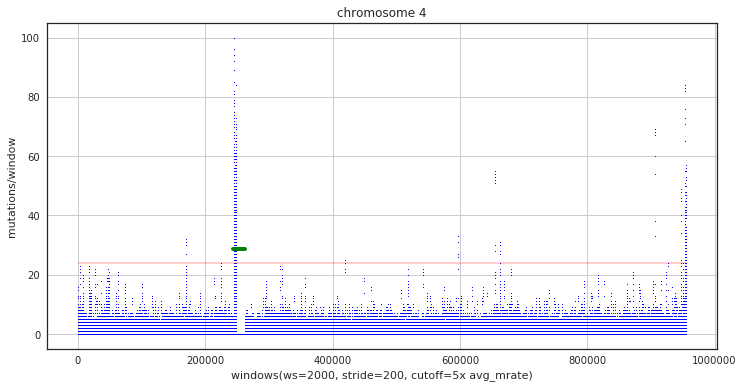

processing chromosome: 5
CPU times: user 13.4 s, sys: 7.58 s, total: 21 s
Wall time: 21 s


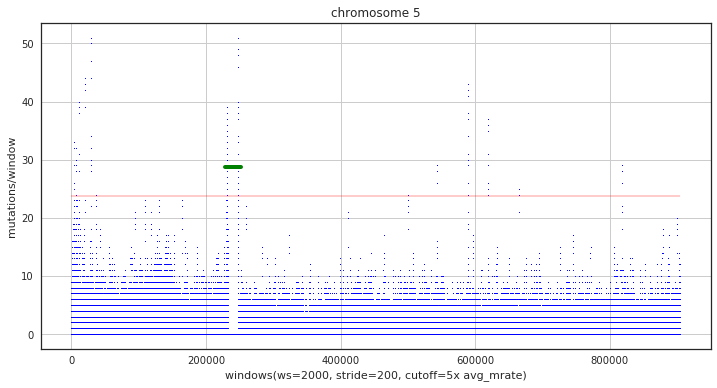

processing chromosome: 6
CPU times: user 12.4 s, sys: 7.07 s, total: 19.5 s
Wall time: 19.5 s


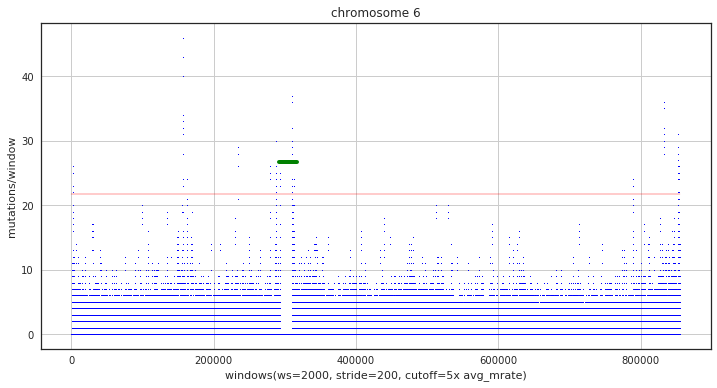

processing chromosome: 7
CPU times: user 11.5 s, sys: 6.6 s, total: 18.1 s
Wall time: 18.1 s


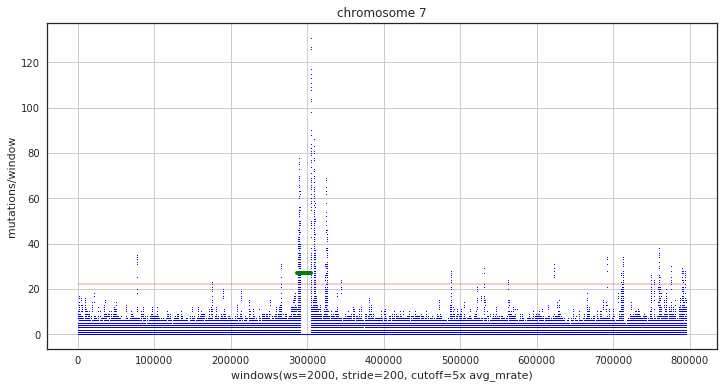

processing chromosome: 8
CPU times: user 10.5 s, sys: 6.02 s, total: 16.5 s
Wall time: 16.5 s


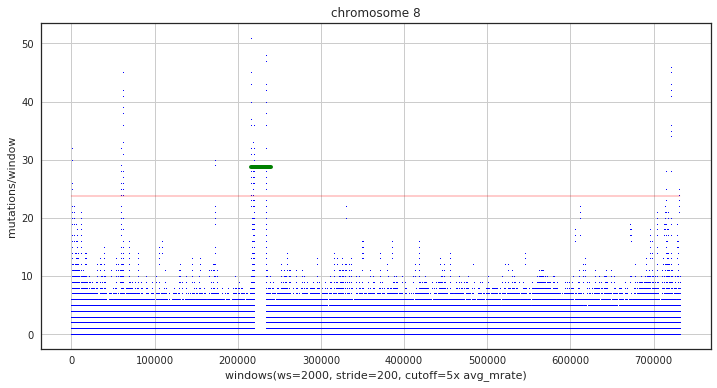

processing chromosome: 9
CPU times: user 10.2 s, sys: 5.88 s, total: 16.1 s
Wall time: 16.1 s


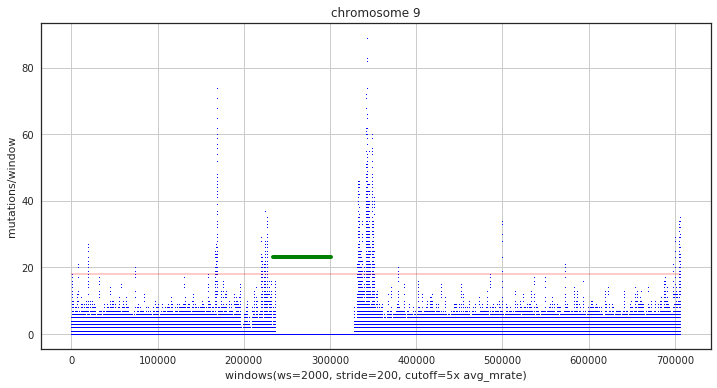

processing chromosome: 10
CPU times: user 10 s, sys: 5.57 s, total: 15.6 s
Wall time: 15.6 s


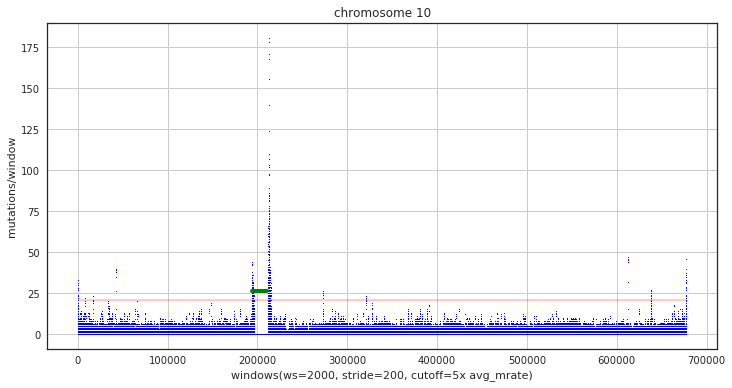

processing chromosome: 11
CPU times: user 10.4 s, sys: 5.6 s, total: 16 s
Wall time: 16 s


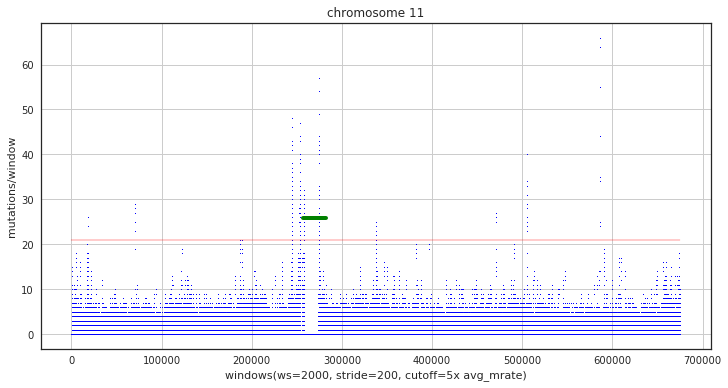

processing chromosome: 12
CPU times: user 9.74 s, sys: 5.52 s, total: 15.3 s
Wall time: 15.2 s


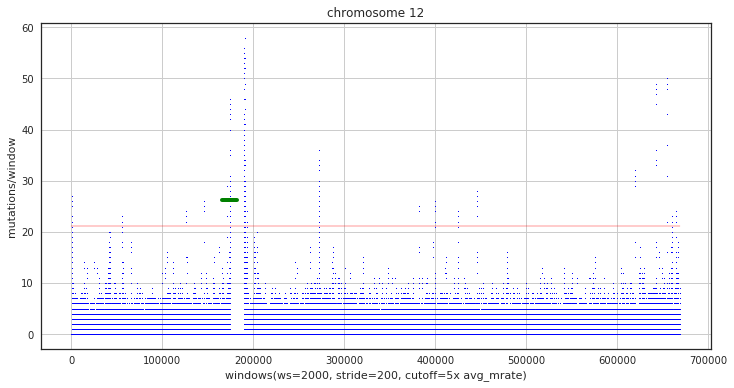

processing chromosome: 13
CPU times: user 8.48 s, sys: 4.79 s, total: 13.3 s
Wall time: 13.3 s


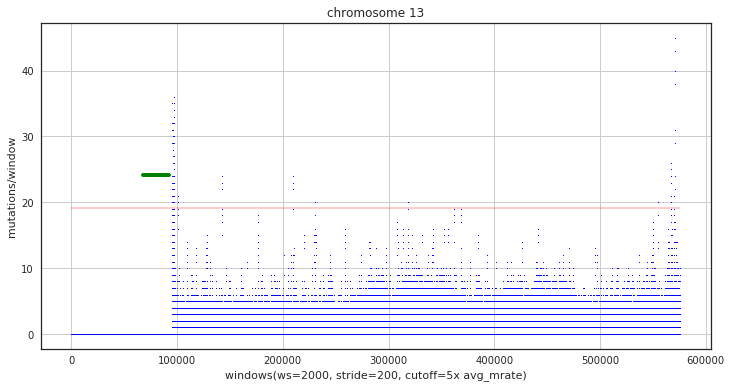

processing chromosome: 14
CPU times: user 8.04 s, sys: 4.43 s, total: 12.5 s
Wall time: 12.5 s


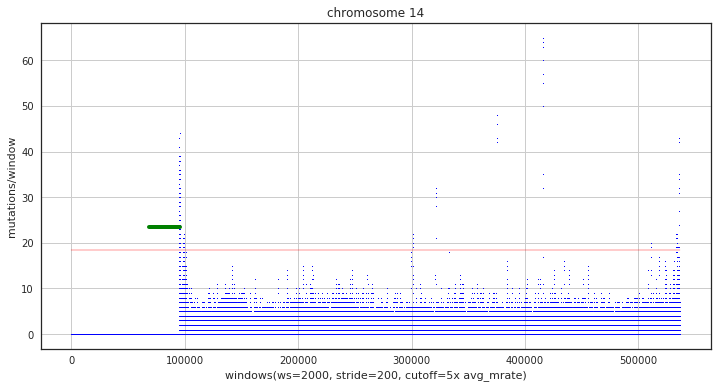

processing chromosome: 15
CPU times: user 7.37 s, sys: 4.28 s, total: 11.6 s
Wall time: 11.6 s


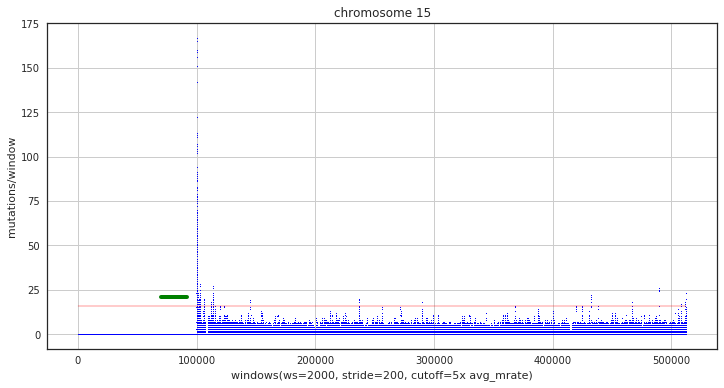

processing chromosome: 16
CPU times: user 7.02 s, sys: 3.79 s, total: 10.8 s
Wall time: 10.8 s


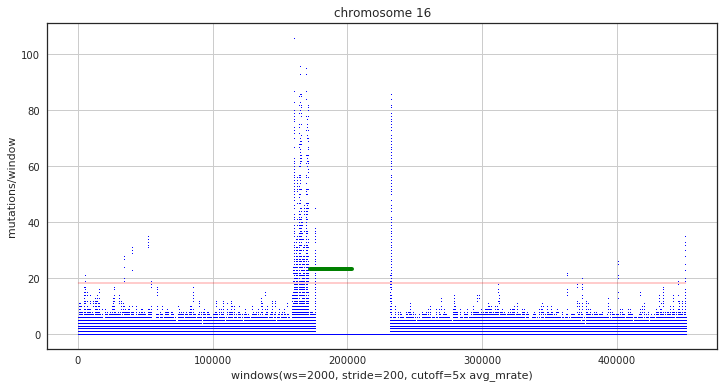

processing chromosome: 17
CPU times: user 5.92 s, sys: 3.36 s, total: 9.28 s
Wall time: 9.28 s


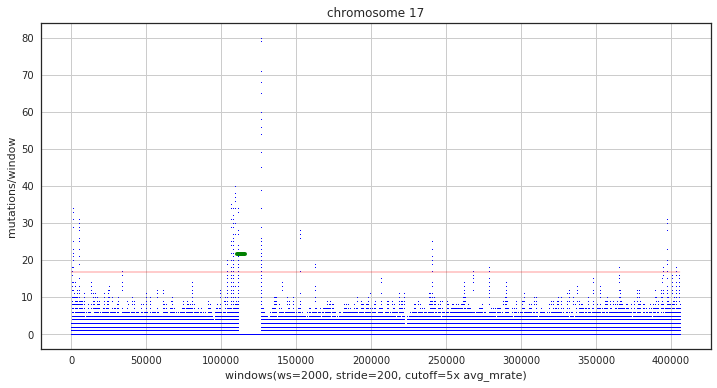

processing chromosome: 18
CPU times: user 5.67 s, sys: 3.23 s, total: 8.9 s
Wall time: 8.89 s


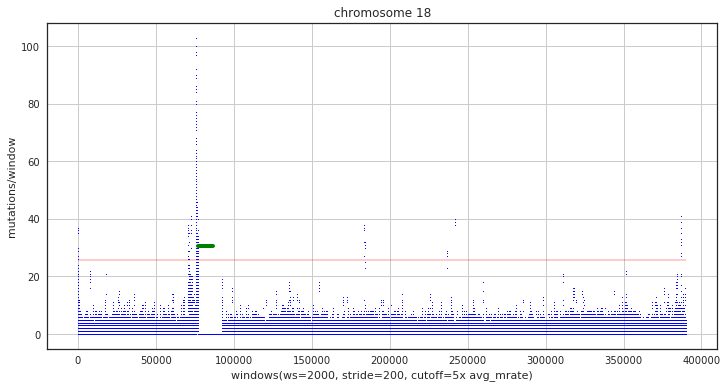

processing chromosome: 19
CPU times: user 4.67 s, sys: 2.41 s, total: 7.08 s
Wall time: 7.08 s


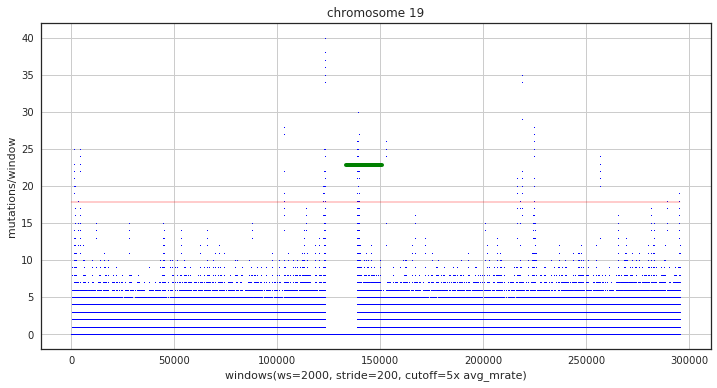

processing chromosome: 20
CPU times: user 4.74 s, sys: 2.7 s, total: 7.43 s
Wall time: 7.43 s


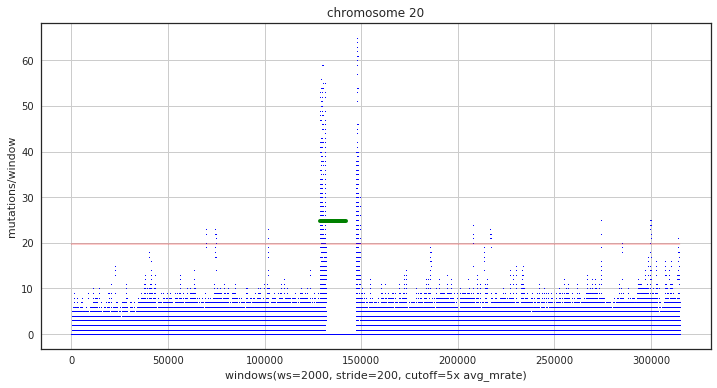

processing chromosome: 21
CPU times: user 3.51 s, sys: 2.04 s, total: 5.55 s
Wall time: 5.54 s


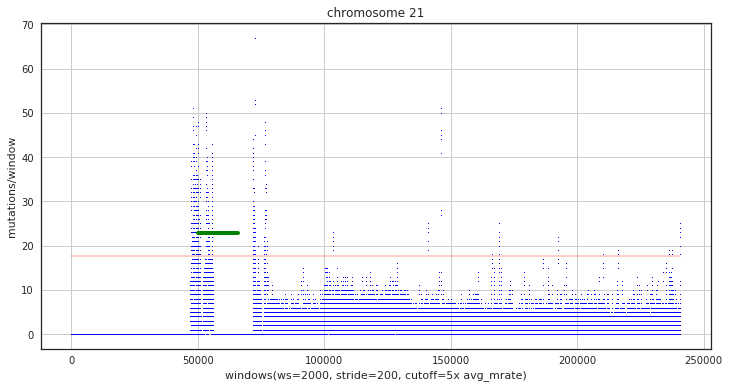

processing chromosome: 22
CPU times: user 3.81 s, sys: 2.15 s, total: 5.96 s
Wall time: 5.96 s


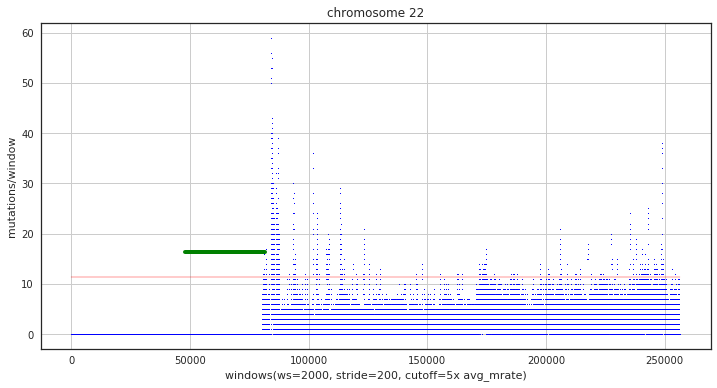

processing chromosome: X
CPU times: user 11.5 s, sys: 6.48 s, total: 18 s
Wall time: 18 s


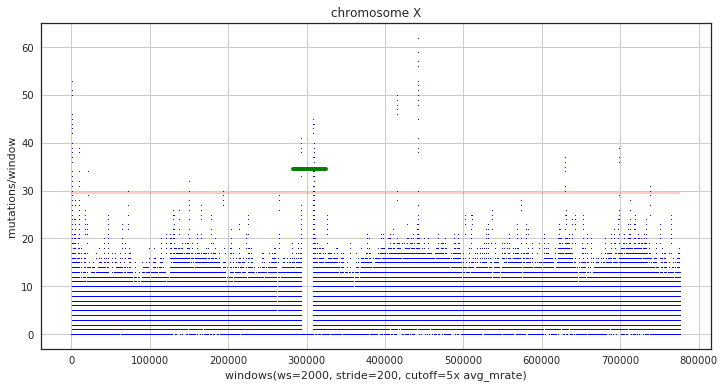

In [84]:
df_regions = pd.DataFrame()
for chrm in chromosomes: #
    print('processing chromosome:', chrm)
    with plt.style.context("seaborn-whitegrid"):
        plt.rcParams["axes.edgecolor"] = "0.15"
        plt.rcParams["axes.linewidth"]  = 1.25
        fig = plt.figure(facecolor='w')
        ax = fig.add_subplot(111)
        chrm_len = mdf.loc[chrm, 'size']
#         centromere location
        centstart, centend = determine_centwin(df2, chrm, wsize, stride, chrm_len) 
        
        qdf = cdf.query('chr == "{}"'.format(chrm))

        zero_arr = np.zeros(chrm_len)
        avg_mrate = mdf.loc[chrm, 'mut_rate']
        w_mrate = wsize * avg_mrate/1000000
#         count numbe of mutation at each position and sort position
        vc_arr = qdf.pos.value_counts().sort_index()
        zero_arr[vc_arr.index.values] = vc_arr.values
        %time wsums, widxs = windowsum(zero_arr, wsize, stride, avg_mrate, chrm, mfold)
#         print(widxs)
        dftmp = pd.DataFrame(data=widxs)
        if df_regions.empty:
            df_regions = dftmp
        else:
            df_regions = pd.concat([df_regions, dftmp], axis=0)


        plt.plot(np.array(range(len(wsums)))+1, wsums, 'b.', markersize=2)
        ax.plot(np.array(range(len(wsums)))+1, wsums, 'b.', ms=2)
        xmax = len(wsums)
        threshold = mfold*w_mrate
        ax.plot((0, xmax), (threshold,threshold), 'r-', linewidth=.4)
        ax.plot((centstart, centend), (threshold+5,threshold+5), 'g-', linewidth=4)
        plt.xlabel('windows(ws={0}, stride={1}, cutoff={2}x avg_mrate)'.format(wsize, stride, mfold))
        
        plt.ylabel('mutations/window')
        plt.title('chromosome {}'.format(chrm))
        dr = '/projects/trans_scratch/validations/workspace/szong/Cervical/hotspots/'
        of = '{0}chromosome{1}_mutations_wsize_{2}_stride_{3}.png'.format(dr, chrm, wsize, stride)
        plt.savefig(of, dpi=200, bbox_inches='tight')
        plt.show()
        plt.close()

df_regions.to_csv(fn, index=False, header=False)

In [57]:
df_regions.shape

(91030, 3)

In [59]:
df_regions.tail()

,0,1,2
21861,23,155208600,155209899
21862,23,155211000,155212499
21863,23,155213600,155217099
21864,23,155224400,155225799
21865,23,155251300,155252799


In [29]:
# fh = tables.open_file(fn, mode='r')
# print(fh.root.data[:,:])
# fh.close()

In [ ]:
# works too
# wsize = 100000
# stride = 10000
# for chrm in chromosomes:
#     qdf = cdf.query('chr == "{}"'.format(chrm))
#     fdf = pd.DataFrame(index=np.arange(mdf.loc[chrm, 'size']))
#     fdf['nmuts'] = 0
#     rdf = qdf.groupby('pos').count()['chr'].to_frame().rename(columns={'chr': 'nmuts'})
#     sdf = pd.merge(fdf, rdf, left_index=True, right_index=True, how='left').fillna(0).drop('nmuts_x', axis=1)
#     a = sdf.nmuts_y.as_matrix(columns=None)
#     wsum = windowsum(a, wsize, stride)
#     plt.plot(wsum, linewidth=.4)
#     plt.title('chromosome{}'.format(chrm))
#     of = '/projects/trans_scratch/validations/workspace/szong/Cervical/hotspots/chromosome{0}_mutations_wsize_{1}_stride_{2}.png'.format(chrm, wsize, stride)
#     plt.savefig(of, dpi=200, bbox_inches='tight')
#     plt.close()

In [125]:
fh.close()

# Intermutational distance analysis

In [6]:
df1.head()

,chr,pos,ref,alt,eff
HTMCP-03-06-02001,1,59734,A,G,INTERGENIC
HTMCP-03-06-02001,1,694016,G,A,DOWNSTREAM
HTMCP-03-06-02001,1,737454,G,C,DOWNSTREAM
HTMCP-03-06-02001,1,757477,T,C,DOWNSTREAM
HTMCP-03-06-02001,1,758253,G,A,DOWNSTREAM


In [7]:
tdf = df1.copy()

In [8]:
tdf['snv1'] = tdf['ref'] + ">" + tdf['alt']
# tdf['snv'] = tdf.loc[:,['ref', 'alt']].apply(lambda x: '>'.join(x), axis=1)
tdf.head()

,chr,pos,ref,alt,eff,snv1
HTMCP-03-06-02001,1,59734,A,G,INTERGENIC,A>G
HTMCP-03-06-02001,1,694016,G,A,DOWNSTREAM,G>A
HTMCP-03-06-02001,1,737454,G,C,DOWNSTREAM,G>C
HTMCP-03-06-02001,1,757477,T,C,DOWNSTREAM,T>C
HTMCP-03-06-02001,1,758253,G,A,DOWNSTREAM,G>A


In [9]:
base_dicts = {'A': 'T', 'T':'A', 'C':'G', 'G':'C'}

In [10]:
def categorize_mutation(x):
#     print(x)
    if len(x) >3:
        y = 'indel'
    elif x.startswith('G') or x.startswith('A'):
        y = ''.join(base_dicts.get(i, i) for i in x)
    else: y = x
#     print(y)
    return y

In [11]:
tdf['snv2'] = tdf['snv1'].apply(categorize_mutation)

In [67]:
tdf.head()

,chr,pos,ref,alt,eff,snv1,snv2
HTMCP-03-06-02001,1,59734,A,G,INTERGENIC,A>G,T>C
HTMCP-03-06-02001,1,694016,G,A,DOWNSTREAM,G>A,C>T
HTMCP-03-06-02001,1,737454,G,C,DOWNSTREAM,G>C,C>G
HTMCP-03-06-02001,1,757477,T,C,DOWNSTREAM,T>C,T>C
HTMCP-03-06-02001,1,758253,G,A,DOWNSTREAM,G>A,C>T


In [13]:
# sorted(tdf.pos.unique())

In [68]:
tdf.snv2.unique()

array(['T>C', 'C>T', 'C>G', 'T>A', 'C>A', 'T>G', 'indel'], dtype=object)

In [15]:
# tdf.groupby(['pos', 'snv2']).chr.count().unstack()

In [52]:
plt.close()

In [79]:
# colors = ['r.', 'g.', 'b.', 'c.', 'y.','k.','m.']
colors = ["purple",
               "#E69F00",
               "#56B4E9",
               "#009E73",
               "#F0E442",
               "#0072B2",
               "#D55E00",
               "#CC79A7",
               "#E41A1C",
               "#377EB8"]

In [142]:
snv_pos.

snv2     C>A  C>G  C>T  T>A  T>C  T>G  indel
pos                                         
9412435  NaN  NaN  NaN  1.0  NaN  NaN    NaN
9413214  NaN  NaN  NaN  NaN  1.0  NaN    NaN
9413224  NaN  NaN  1.0  NaN  NaN  NaN    NaN
9413247  NaN  NaN  NaN  NaN  2.0  NaN    NaN
9413275  NaN  NaN  NaN  NaN  NaN  NaN    1.0
46255 46255


/home/szong/anaconda3/lib/python3.6/site-packages/matplotlib/font_manager.py:1297: UserWarning: findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


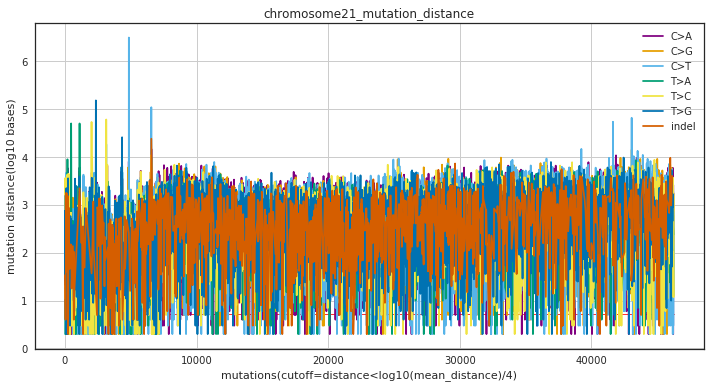

In [35]:
fold_change = 4
for chrm in ['21']:#chromosomes:#['21', '22']:#
    with plt.style.context("seaborn-whitegrid"):
        plt.rcParams["axes.edgecolor"] = "0.15"
        plt.rcParams["axes.linewidth"]  = 1.25
        fig = plt.figure(facecolor='w')
        ax = fig.add_subplot(111)
        
    qdf = tdf.query('chr == "{}"'.format(chrm))
    rdf = qdf.groupby(['pos', 'snv2']).chr.count().unstack()
    print(rdf.head())
    snv_positions = qdf.pos.unique()
    snv_positions.sort()
    idxs = rdf.index.tolist()
    print(len(snv_positions), len(idxs))
    assert (snv_positions == idxs).all()
    rdf = rdf.reset_index()
    shifted_positions = shift(snv_positions, 1, cval=np.nan)
    dist = (snv_positions - shifted_positions)[1:]
    avg_distance = np.mean(dist)
    xmax = len(snv_positions)
    threshold = np.log10(avg_distance)/fold_change
    ax.plot((0, xmax), (threshold,threshold), 'r-', linewidth=.8)
    x1 = np.arange(len(dist))
    y1 = np.log10(dist+1)
#     ax.plot(x1, y1, 'w.', markersize=.2)
    
#     plot different types of base changes
    mut_types = rdf.columns.tolist()
    mut_types.remove('pos')
    mut_types
    for k, mtype in enumerate(mut_types):
        sdf = rdf[mtype][1:].to_frame()
        x2 = sdf[sdf[mtype].notnull()].index.tolist()[:-1]
        y2 = y1[x2]
        ax.plot(x2, y2, colors[k], ms=.5, label=mtype)
        plt.legend(loc='upper right', markerscale=10)
    plt.title('chromosome{}_mutation_distance'.format(chrm))
    plt.xlabel('mutations(cutoff=distance<log10(mean_distance)/{})'.format(fold_change))
    plt.ylabel('mutation distance(log10 bases)')


    dr = '/projects/trans_scratch/validations/workspace/szong/Cervical/hotspots/test/'
    of = '{0}chromosome{1}_mutation_distance.png'.format(dr, chrm)
    plt.savefig(of, dpi=200, bbox_inches='tight')
    plt.show()
    plt.close()

In [130]:
df = df2.copy()
snv_pos = np.array([2, 5, 9, 12, 15, 19, 23, 33])
def locate_centromere(df, chrm, snv_pos):
    if chrm == 'X':
        chrm = '23'
    if chrm == 'Y':
        chrm = '24'
    dftmp = (df.query('chr == "{}"'.format(chrm))[['start', 'end']])
    cen_start = dftmp.min().min()
    cen_end = dftmp.max().max()
    print(cen_start, cen_end)
    lidx = np.abs(snv_pos - cen_start).argmin()
    hidx = np.abs(snv_pos - cen_end).argmin()
    
#     low = snv_pos[snv_pos <= cen_start].max()
#     lowidx = np.where(snv_pos==low)
#     high = snv_pos[snv_pos >= cen_end].min()
#     highidx = np.where(snv_pos==high)
    print(lidx,hidx)
    return (lidx, hidx)
    
assert locate_centromere(df, 99, snv_pos) == (3,5)

12 18
3 5


In [129]:
locate_centromere(df, 99, snv_pos)[1][0]

12 18
(array([3]),) (array([5]),)


array([5])

snv2   C>A  C>G  C>T  T>A  T>C  T>G  indel
10235  NaN  NaN  NaN  1.0  NaN  NaN    NaN
10330  1.0  NaN  NaN  NaN  NaN  NaN    NaN
10354  1.0  NaN  NaN  NaN  NaN  NaN    NaN
10365  NaN  NaN  NaN  NaN  1.0  NaN    NaN
10397  1.0  NaN  NaN  NaN  NaN  NaN    1.0
292426 292426
121100000 128000000
193758 194648
0
1
2
3
4
5
6


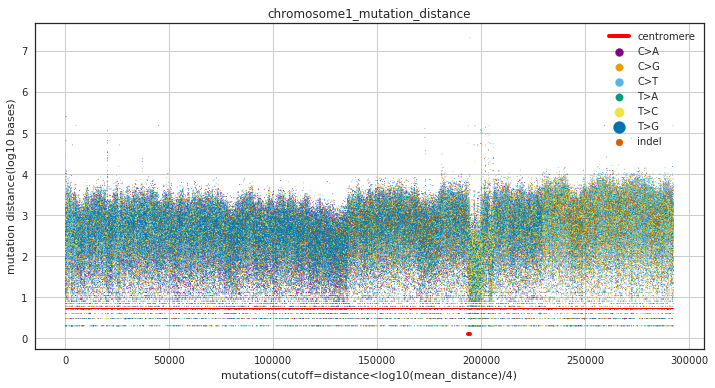

snv2   C>A  C>G  C>T  T>A  T>C  T>G  indel
11414  NaN  NaN  1.0  NaN  NaN  NaN    NaN
13026  NaN  NaN  1.0  NaN  NaN  NaN    NaN
13060  NaN  NaN  2.0  NaN  NaN  NaN    NaN
13074  NaN  NaN  1.0  NaN  NaN  NaN    NaN
13088  NaN  NaN  1.0  NaN  NaN  NaN    NaN
183054 183054
91000000 95700000
73691 76894
0
1
2
3
4
5
6


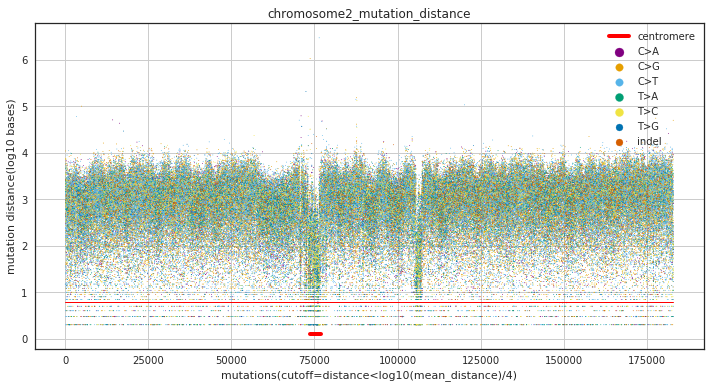

snv2   C>A  C>G  C>T  T>A  T>C  T>G  indel
60634  NaN  1.0  NaN  NaN  NaN  NaN    NaN
60688  NaN  NaN  1.0  NaN  NaN  NaN    NaN
60954  NaN  1.0  NaN  NaN  NaN  NaN    NaN
62607  NaN  NaN  NaN  NaN  1.0  NaN    NaN
63229  NaN  1.0  NaN  NaN  NaN  NaN    NaN
166640 166640
89400000 93200000
60790 62424
0
1
2
3
4
5
6


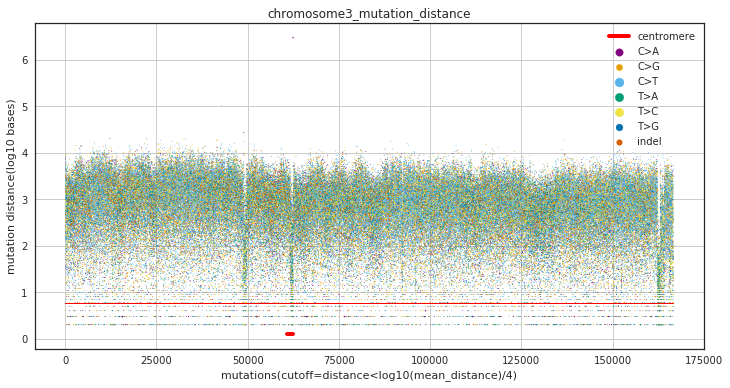

snv2   C>A  C>G  C>T  T>A  T>C  T>G  indel
10168  NaN  NaN  NaN  1.0  NaN  NaN    NaN
10225  NaN  NaN  NaN  NaN  1.0  NaN    NaN
10438  NaN  NaN  NaN  NaN  1.0  NaN    NaN
10548  2.0  NaN  NaN  NaN  NaN  NaN    NaN
10697  1.0  NaN  NaN  NaN  NaN  NaN    NaN
136038 136038
48700000 52400000
32948 37105
0
1
2
3
4
5
6


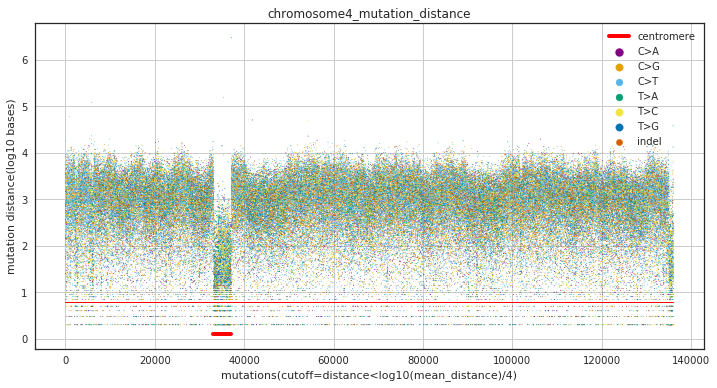

snv2   C>A  C>G  C>T  T>A  T>C  T>G  indel
11754  NaN  NaN  NaN  NaN  1.0  NaN    NaN
11756  NaN  NaN  NaN  NaN  NaN  NaN    1.0
11798  NaN  NaN  NaN  NaN  1.0  NaN    NaN
12304  NaN  NaN  1.0  NaN  NaN  NaN    NaN
12941  NaN  1.0  NaN  NaN  NaN  NaN    NaN
145708 145708
45800000 50500000
56373 58942
0
1
2
3
4
5
6


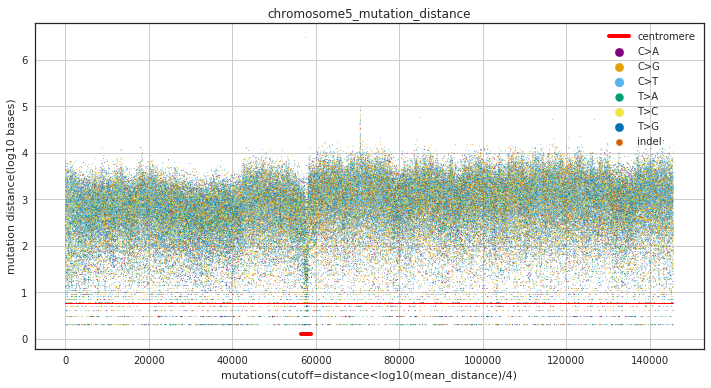

snv2    C>A  C>G  C>T  T>A  T>C  T>G  indel
108710  NaN  1.0  NaN  NaN  NaN  NaN    NaN
162235  NaN  1.0  NaN  NaN  NaN  NaN    NaN
186889  NaN  NaN  NaN  1.0  NaN  NaN    NaN
203236  NaN  NaN  1.0  NaN  NaN  NaN    NaN
203282  NaN  NaN  NaN  NaN  1.0  NaN    NaN
118110 118110
58400000 63400000
39498 41736
0
1
2
3
4
5
6


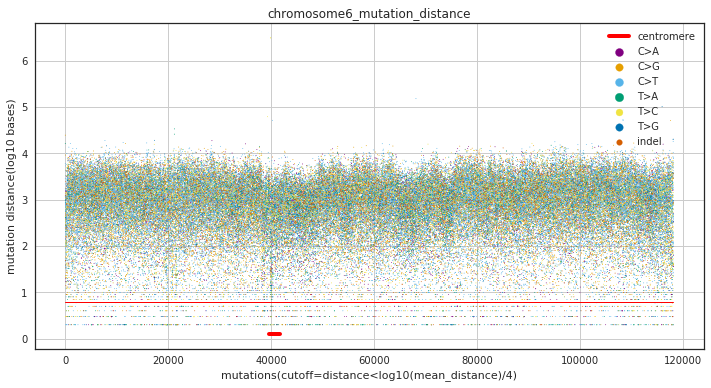

snv2   C>A  C>G  C>T  T>A  T>C  T>G  indel
16402  NaN  NaN  NaN  NaN  NaN  NaN    1.0
16410  NaN  NaN  NaN  NaN  1.0  NaN    NaN
16427  NaN  NaN  NaN  NaN  NaN  NaN    1.0
16441  NaN  NaN  NaN  NaN  1.0  NaN    NaN
20027  NaN  NaN  NaN  NaN  NaN  1.0    NaN
120440 120440
57400000 61100000
42048 45458
0
1
2
3
4
5
6


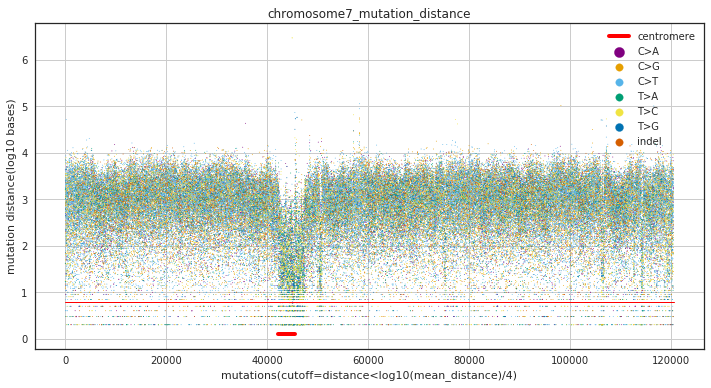

snv2   C>A  C>G  C>T  T>A  T>C  T>G  indel
11842  NaN  NaN  NaN  NaN  1.0  NaN    NaN
23497  NaN  NaN  1.0  NaN  NaN  NaN    NaN
23807  NaN  NaN  1.0  NaN  NaN  NaN    NaN
25363  NaN  NaN  1.0  NaN  NaN  NaN    NaN
25668  NaN  NaN  1.0  NaN  NaN  NaN    NaN
119087 119087
43200000 48100000
33551 35934
0
1
2
3
4
5
6


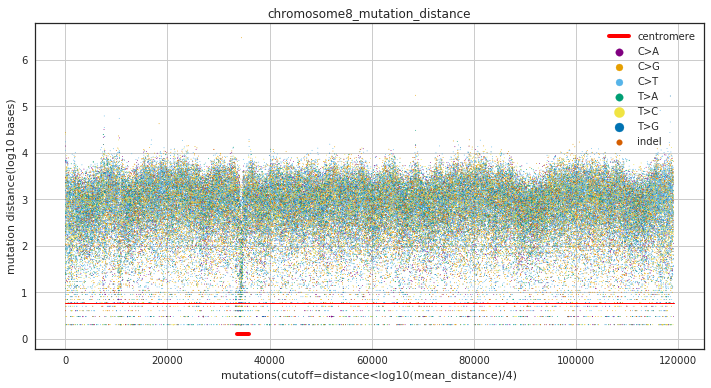

snv2   C>A  C>G  C>T  T>A  T>C  T>G  indel
10581  NaN  NaN  1.0  NaN  NaN  NaN    NaN
10616  NaN  1.0  NaN  NaN  NaN  NaN    NaN
10742  NaN  NaN  NaN  NaN  1.0  NaN    NaN
10809  NaN  NaN  1.0  NaN  NaN  NaN    NaN
12667  NaN  NaN  NaN  NaN  1.0  NaN    NaN
90494 90494
46700000 60300000
33711 33911
0
1
2
3
4
5
6


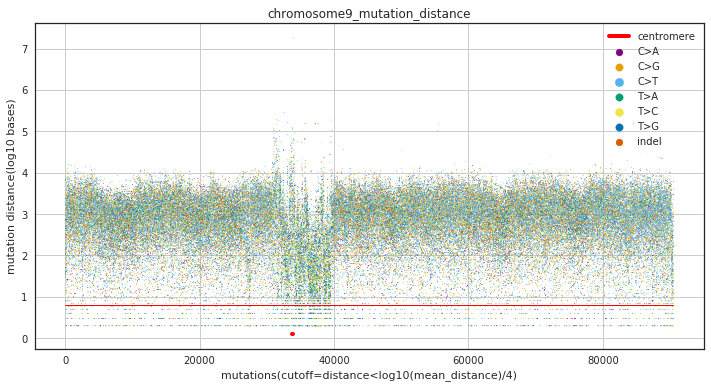

snv2   C>A  C>G  C>T  T>A  T>C  T>G  indel
60524  NaN  1.0  NaN  NaN  NaN  NaN    NaN
70763  NaN  NaN  NaN  NaN  1.0  NaN    NaN
70996  NaN  NaN  1.0  NaN  NaN  NaN    NaN
71350  NaN  NaN  NaN  NaN  1.0  NaN    NaN
73297  NaN  NaN  NaN  NaN  NaN  NaN    1.0
96663 96663
38800000 42100000
28039 29516
0
1
2
3
4
5
6


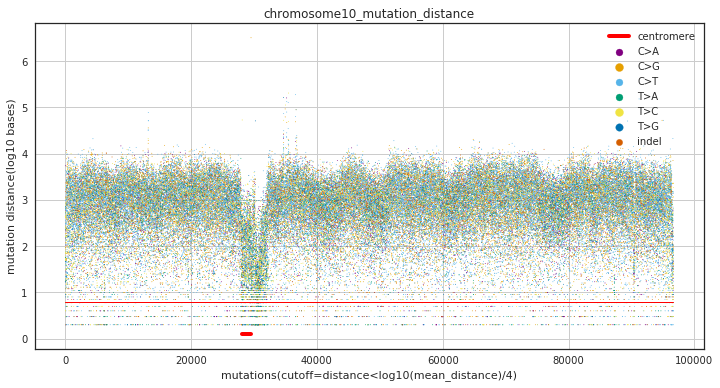

snv2    C>A  C>G  C>T  T>A  T>C  T>G  indel
102863  NaN  NaN  NaN  NaN  1.0  NaN    NaN
113412  1.0  NaN  NaN  NaN  NaN  NaN    NaN
121869  1.0  NaN  NaN  NaN  NaN  NaN    NaN
128460  1.0  NaN  NaN  NaN  NaN  NaN    NaN
128709  NaN  NaN  NaN  NaN  1.0  NaN    NaN
92593 92593
51400000 56400000
38272 40603
0
1
2
3
4
5
6


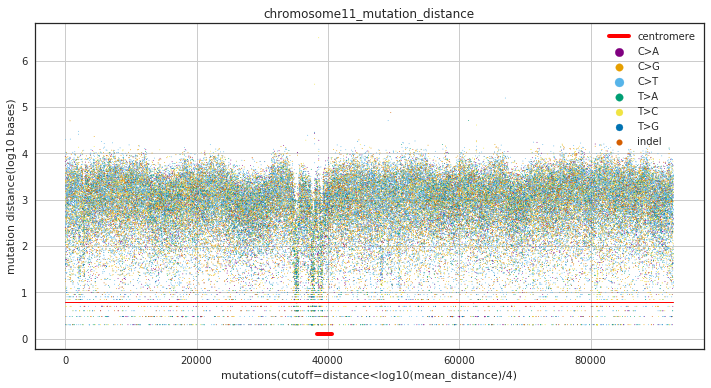

snv2   C>A  C>G  C>T  T>A  T>C  T>G  indel
61161  NaN  NaN  NaN  NaN  1.0  NaN    NaN
61722  NaN  1.0  NaN  NaN  NaN  NaN    NaN
61944  NaN  1.0  NaN  NaN  NaN  NaN    NaN
62156  NaN  1.0  NaN  NaN  NaN  NaN    NaN
65118  NaN  1.0  NaN  NaN  NaN  NaN    NaN
98090 98090
33200000 36500000
23415 25326
0
1
2
3
4
5
6


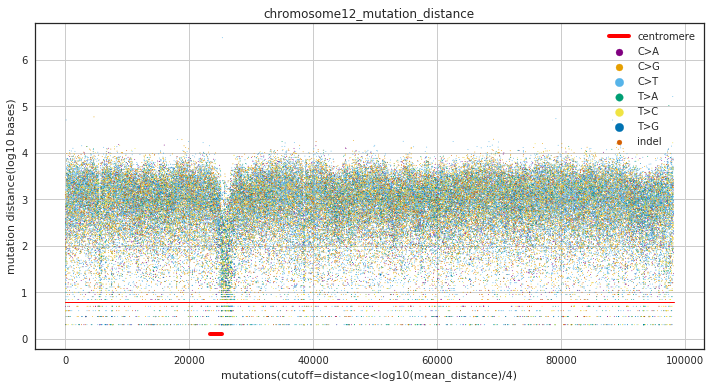

snv2      C>A  C>G  C>T  T>A  T>C  T>G  indel
19020570  NaN  NaN  1.0  NaN  NaN  NaN    NaN
19020731  NaN  NaN  1.0  NaN  NaN  NaN    NaN
19020817  NaN  NaN  1.0  NaN  NaN  NaN    NaN
19020825  NaN  NaN  NaN  NaN  NaN  1.0    NaN
19020849  NaN  NaN  NaN  NaN  NaN  2.0    NaN
77002 77002
13500000 18400000
0 0
0
1
2
3
4
5
6


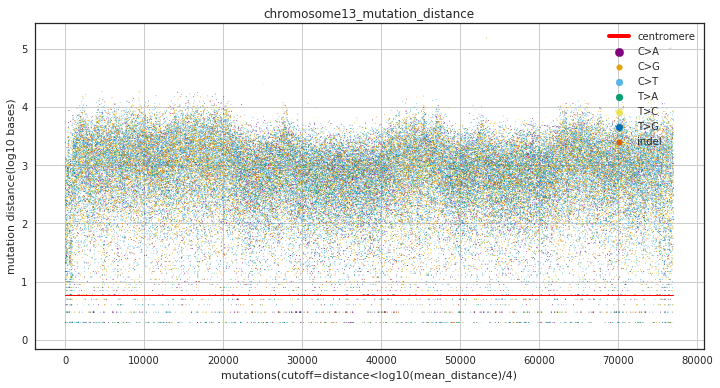

snv2      C>A  C>G  C>T  T>A  T>C  T>G  indel
19000087  NaN  NaN  NaN  1.0  NaN  NaN    NaN
19000104  NaN  NaN  NaN  NaN  1.0  NaN    NaN
19000952  NaN  NaN  NaN  NaN  1.0  NaN    NaN
19001169  NaN  NaN  1.0  NaN  NaN  NaN    NaN
19001362  NaN  NaN  NaN  1.0  NaN  NaN    NaN
70287 70287
13600000 19100000
0 574
0
1
2
3
4
5
6


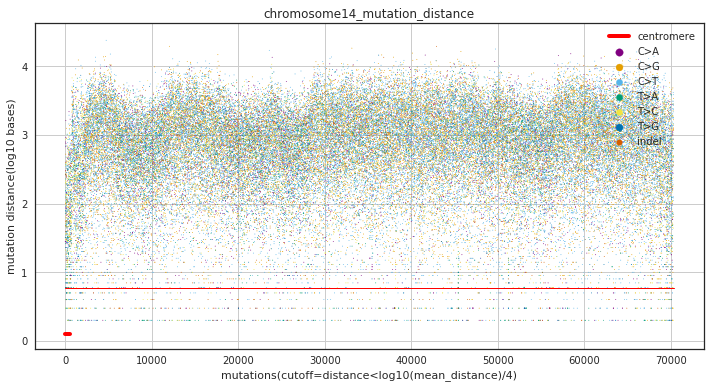

snv2      C>A  C>G  C>T  T>A  T>C  T>G  indel
20000254  NaN  NaN  NaN  1.0  NaN  NaN    NaN
20000367  NaN  NaN  NaN  NaN  NaN  2.0    NaN
20000623  NaN  NaN  NaN  NaN  1.0  NaN    NaN
20000694  NaN  NaN  1.0  NaN  NaN  NaN    NaN
20000759  NaN  NaN  NaN  NaN  1.0  NaN    NaN
57294 57294
14100000 18400000
0 0
0
1
2
3
4
5
6


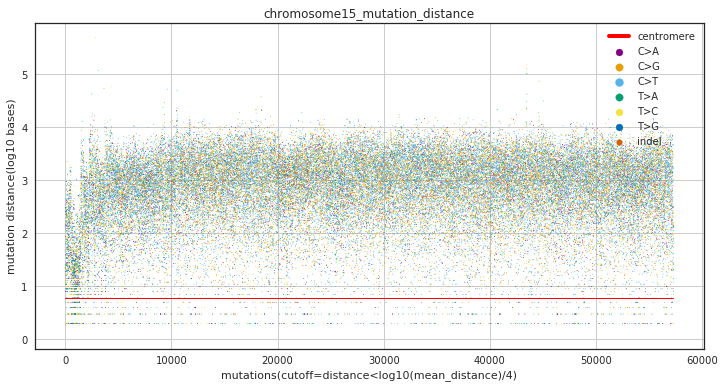

snv2   C>A  C>G  C>T  T>A  T>C  T>G  indel
60606  NaN  NaN  1.0  NaN  NaN  NaN    NaN
61118  NaN  NaN  1.0  NaN  NaN  NaN    NaN
61167  NaN  NaN  NaN  NaN  1.0  NaN    NaN
61871  NaN  NaN  NaN  1.0  NaN  NaN    NaN
63494  NaN  NaN  NaN  NaN  NaN  1.0    NaN
66205 66205
34400000 40700000
30357 31623
0
1
2
3
4
5
6


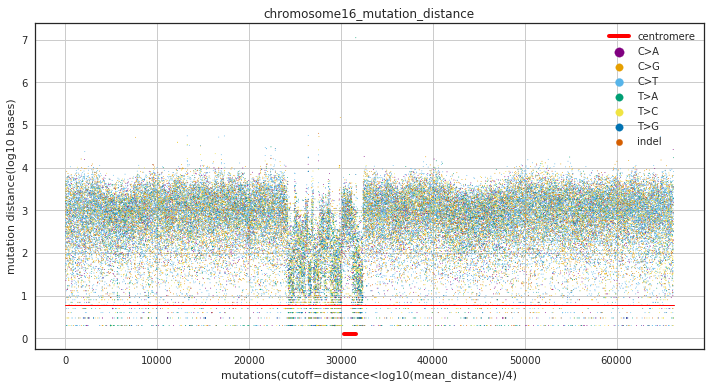

snv2  C>A  C>G  C>T  T>A  T>C  T>G  indel
1650  NaN  NaN  1.0  NaN  NaN  NaN    NaN
2812  NaN  1.0  NaN  NaN  NaN  NaN    NaN
7114  NaN  NaN  1.0  NaN  NaN  NaN    NaN
7860  NaN  NaN  1.0  NaN  NaN  NaN    NaN
8657  NaN  NaN  1.0  NaN  NaN  NaN    NaN
53235 53235
22100000 23200000
14771 15081
0
1
2
3
4
5
6


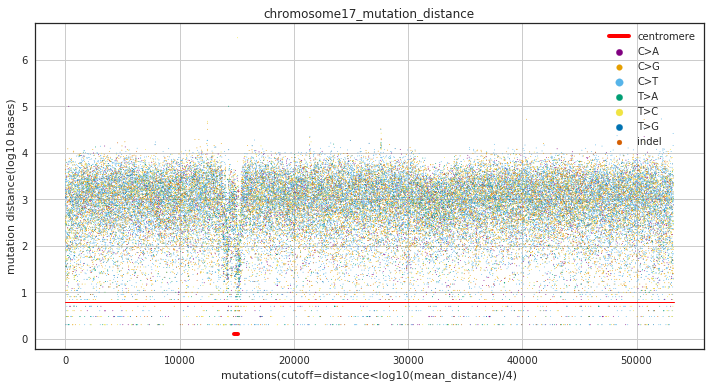

snv2   C>A  C>G  C>T  T>A  T>C  T>G  indel
10148  NaN  NaN  NaN  1.0  NaN  NaN    NaN
10168  NaN  NaN  NaN  1.0  NaN  NaN    NaN
10626  1.0  NaN  NaN  NaN  NaN  NaN    NaN
11018  NaN  NaN  1.0  NaN  NaN  NaN    NaN
11020  NaN  NaN  NaN  NaN  NaN  1.0    NaN
64299 64299
15400000 17300000
15202 15281
0
1
2
3
4
5
6


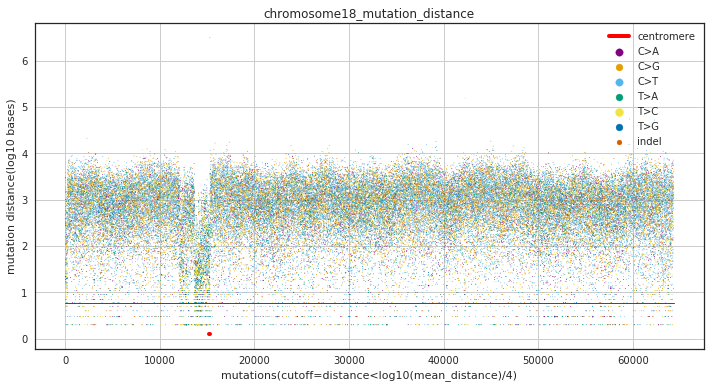

snv2   C>A  C>G  C>T  T>A  T>C  T>G  indel
60659  NaN  NaN  NaN  NaN  1.0  NaN    NaN
60769  NaN  NaN  2.0  NaN  NaN  NaN    NaN
70171  NaN  NaN  NaN  NaN  1.0  NaN    NaN
81907  NaN  NaN  1.0  NaN  NaN  NaN    NaN
89289  NaN  NaN  NaN  NaN  1.0  NaN    NaN
48186 48186
26700000 30200000
19391 22744
0
1
2
3
4
5
6


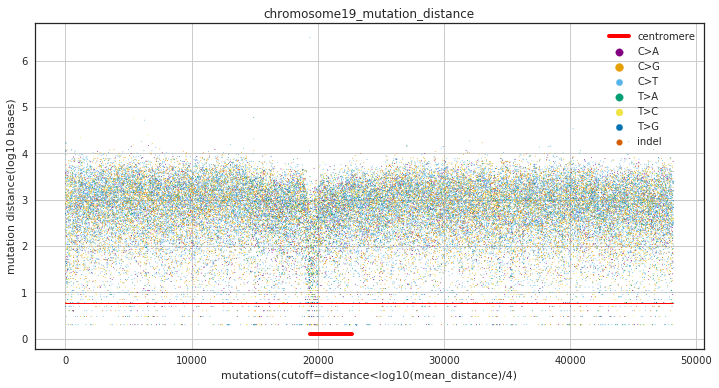

snv2   C>A  C>G  C>T  T>A  T>C  T>G  indel
60159  NaN  1.0  NaN  NaN  NaN  NaN    NaN
64239  NaN  1.0  NaN  NaN  NaN  NaN    NaN
64259  NaN  NaN  NaN  NaN  1.0  NaN    NaN
65396  NaN  NaN  NaN  NaN  1.0  NaN    NaN
67291  NaN  1.0  NaN  NaN  NaN  NaN    NaN
68206 68206
25700000 28400000
27220 29532
0
1
2
3
4
5
6


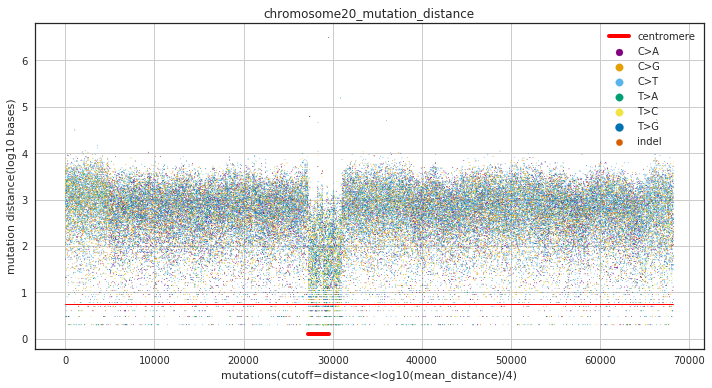

snv2     C>A  C>G  C>T  T>A  T>C  T>G  indel
9412435  NaN  NaN  NaN  1.0  NaN  NaN    NaN
9413214  NaN  NaN  NaN  NaN  1.0  NaN    NaN
9413224  NaN  NaN  1.0  NaN  NaN  NaN    NaN
9413247  NaN  NaN  NaN  NaN  2.0  NaN    NaN
9413275  NaN  NaN  NaN  NaN  NaN  NaN    1.0
46255 46255
10000000 13200000
1874 4852
0
1
2
3
4
5
6


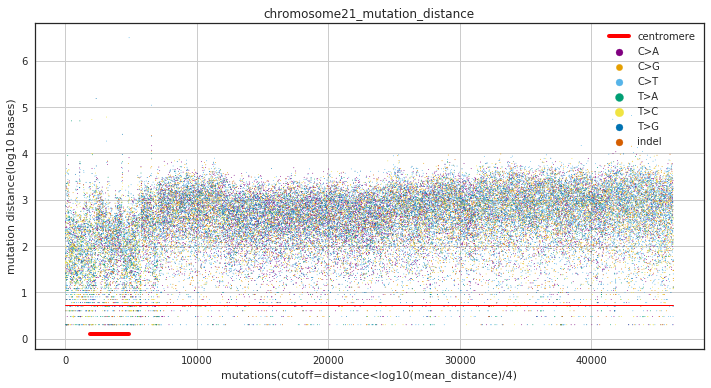

snv2      C>A  C>G  C>T  T>A  T>C  T>G  indel
16050353  NaN  1.0  NaN  NaN  NaN  NaN    NaN
16051975  1.0  NaN  NaN  NaN  NaN  NaN    NaN
16051995  NaN  NaN  1.0  NaN  NaN  NaN    NaN
16052173  NaN  NaN  NaN  NaN  NaN  NaN    1.0
16053249  NaN  NaN  1.0  NaN  NaN  NaN    NaN
44632 44632
9600000 16300000
0 363
0
1
2
3
4
5
6


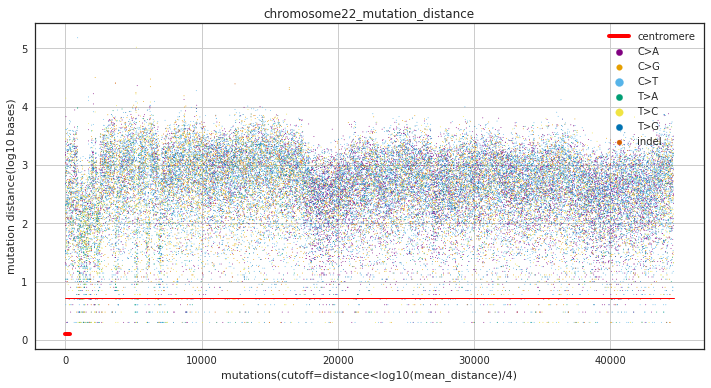

snv2   C>A  C>G  C>T  T>A  T>C  T>G  indel
60258  NaN  1.0  NaN  NaN  NaN  NaN    NaN
60317  NaN  NaN  1.0  NaN  NaN  NaN    NaN
60378  NaN  NaN  1.0  NaN  NaN  NaN    NaN
60399  NaN  NaN  1.0  NaN  NaN  NaN    NaN
60455  NaN  NaN  1.0  NaN  NaN  NaN    NaN
451008 451008
56600000 65000000
150796 167993
0
1
2
3
4
5
6


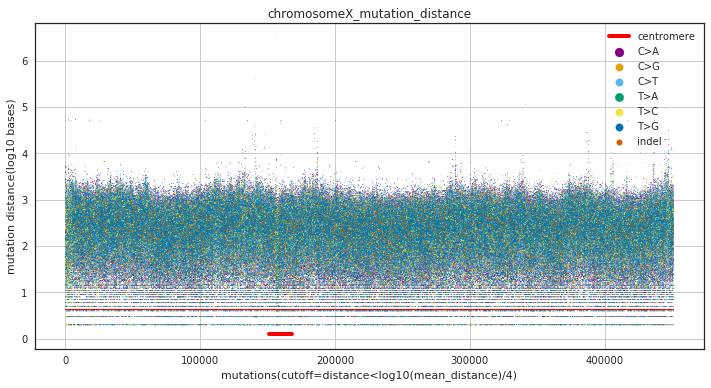

In [139]:
# new testing, combine 6 type base change together
fold_change = 4
for chrm in chromosomes:#['21', '22']:#
    with plt.style.context("seaborn-whitegrid"):
        plt.rcParams["axes.edgecolor"] = "0.15"
        plt.rcParams["axes.linewidth"]  = 1.25
        fig = plt.figure(facecolor='w')
        ax = fig.add_subplot(111)
        
        qdf = tdf.query('chr == "{}"'.format(chrm))
        rdf = qdf.groupby(['pos', 'snv2']).chr.count().unstack()
        del rdf.index.name

        print(rdf.head())
        snv_positions = qdf.pos.unique()
        snv_positions.sort()
        idxs = rdf.index.tolist()
        print(len(snv_positions), len(idxs))
        assert (snv_positions == idxs).all()
#         figure out the centromer position
#         df2 contains centromere coordinates
        cen_start, cen_end = locate_centromere(df2, chrm, np.array(snv_positions))
        rdf = rdf.reset_index()

        shifted_positions = shift(snv_positions, 1, cval=np.nan)
        dist = (snv_positions - shifted_positions)[1:]
        avg_distance = np.mean(dist)
        xmax = len(snv_positions)
        threshold = np.log10(avg_distance)/fold_change
        ax.plot((0, xmax), (threshold,threshold), 'r-', linewidth=1)
        ax.plot((cen_start, cen_end), (0.1,0.1), 'r-', linewidth=4, label='centromere')
        x1 = np.arange(len(dist))
        y1 = np.log10(dist+1)
    #     plot different types of base changes
        mut_types = rdf.columns.tolist()
        mut_types.remove('index')
    #     mut_types = ['T>G']
        for k, mtype in enumerate(mut_types):
            print(k)
            sdf = rdf[mtype][1:].to_frame()
            x2 = sdf[sdf[mtype].notnull()].index.tolist()[:-1]
            y2 = y1[x2]
            z2 = sdf.loc[x2,mtype].tolist()
            plt.scatter(x2,y2, c=colors[k], marker='.', s=z2, label=mtype)
            plt.legend(loc='upper right', markerscale=8)
        plt.title('chromosome{}_mutation_distance'.format(chrm))
        plt.xlabel('mutations(cutoff=distance<log10(mean_distance)/{})'.format(fold_change))
        plt.ylabel('mutation distance(log10 bases)')


        dr = '/projects/trans_scratch/validations/workspace/szong/Cervical/hotspots/'
        of = '{0}chromosome{1}_mutation_distance.png'.format(dr, chrm)
        plt.savefig(of, dpi=200, bbox_inches='tight')
        plt.show()
        plt.close()

In [97]:
# sdf.loc[x2,]
# x2
# z2
rdf.head()
# mut_types

snv2,index,C>A,C>G,C>T,T>A,T>C,T>G,indel
0,9412435,NaN,NaN,NaN,1.0,NaN,NaN,NaN
1,9413214,NaN,NaN,NaN,NaN,1.0,NaN,NaN
2,9413224,NaN,NaN,1.0,NaN,NaN,NaN,NaN
3,9413247,NaN,NaN,NaN,NaN,2.0,NaN,NaN
4,9413275,NaN,NaN,NaN,NaN,NaN,NaN,1.0


In [110]:
rdf['total'] = rdf.sum(axis=1)
rdf.head()

snv2,C>A,C>G,C>T,T>A,T>C,T>G,indel,total
pos,,,,,,,,
9412435,NaN,NaN,NaN,1.0,NaN,NaN,NaN,1.0
9413214,NaN,NaN,NaN,NaN,1.0,NaN,NaN,1.0
9413224,NaN,NaN,1.0,NaN,NaN,NaN,NaN,1.0
9413247,NaN,NaN,NaN,NaN,2.0,NaN,NaN,2.0
9413275,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0


In [123]:
rdf.head()

snv2,C>A,C>G,C>T,T>A,T>C,T>G,indel,total,pos1,pos2,distance
pos,,,,,,,,,,,
9412435,NaN,NaN,NaN,1.0,NaN,NaN,NaN,1.0,9412435,NaN,NaN
9413214,NaN,NaN,NaN,NaN,1.0,NaN,NaN,1.0,9413214,9412435.0,779.0
9413224,NaN,NaN,1.0,NaN,NaN,NaN,NaN,1.0,9413224,9413214.0,10.0
9413247,NaN,NaN,NaN,NaN,2.0,NaN,NaN,2.0,9413247,9413224.0,23.0
9413275,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,9413275,9413247.0,28.0


In [65]:
rdf.head()

snv2,pos,C>A,C>G,C>T,T>A,T>C,T>G,indel
0,60258,NaN,1.0,NaN,NaN,NaN,NaN,NaN
1,60317,NaN,NaN,1.0,NaN,NaN,NaN,NaN
2,60378,NaN,NaN,1.0,NaN,NaN,NaN,NaN
3,60399,NaN,NaN,1.0,NaN,NaN,NaN,NaN
4,60455,NaN,NaN,1.0,NaN,NaN,NaN,NaN


In [48]:
# rdf[rdf.drop('pos', axis=1).sum(axis=1) >1]

In [56]:
tdf.snv2.value_counts()

C>A      2194288
C>T      1779277
T>G      1023385
T>C       614128
C>G       591721
T>A       223215
indel     100360
Name: snv2, dtype: int64

In [188]:
rdf.shape

(57301, 7)

In [192]:
shifted = rdf.shift(1)

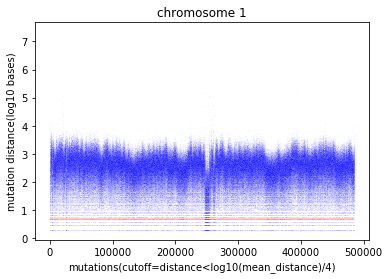

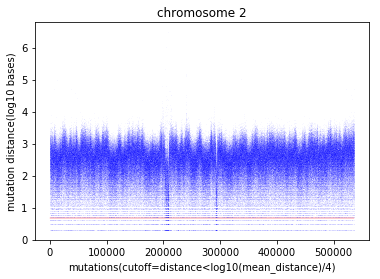

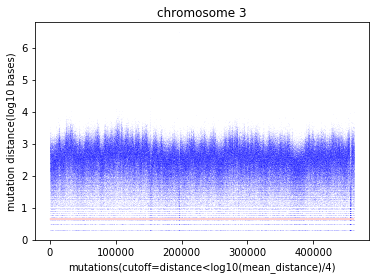

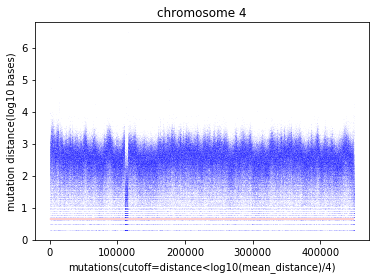

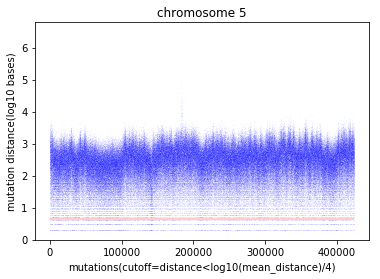

...

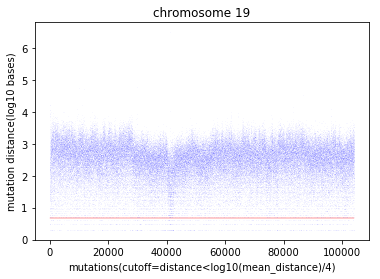

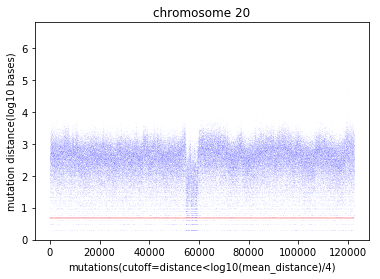

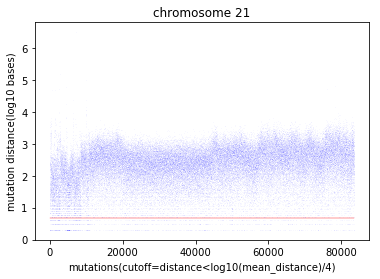

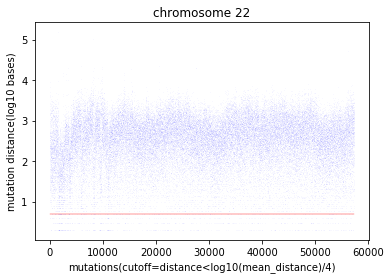

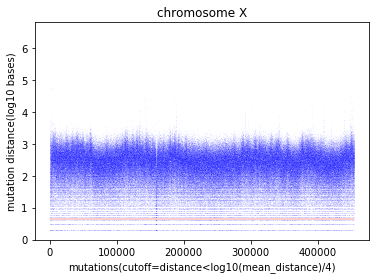

In [47]:
fold_change = 4
for chrm in chromosomes:
    qdf = cdf.query('chr == "{}"'.format(chrm))
    snv_positions = qdf.pos.unique()
    snv_positions.sort()
    shifted_positions = shift(snv_positions, 1, cval=np.nan)
    dist = (snv_positions - shifted_positions)[1:]
    avg_distance = np.mean(dist)
    xmax = len(snv_positions)
    threshold = np.log10(avg_distance)/fold_change
    plt.plot((0, xmax), (threshold,threshold), 'r-', linewidth=.4)
    
    plt.plot(np.arange(len(dist)), np.log10(dist+1), 'b.', markersize=.02)
    plt.title('chromosome{}_mutation_distance'.format(chrm))
    plt.xlabel('mutations(cutoff=distance<log10(mean_distance)/{})'.format(fold_change))
    plt.ylabel('mutation distance(log10 bases)')
    plt.title('chromosome {}'.format(chrm))

    dr = '/projects/trans_scratch/validations/workspace/szong/Cervical/hotspots/'
    of = '{0}chromosome{1}_mutation_distance.png'.format(dr, chrm)
    plt.savefig(of, dpi=200, bbox_inches='tight')
    plt.show()
    plt.close()

In [31]:
qdf.pos.unique()

array([16127799, 16216386, 16238635, ..., 17042175, 26392556, 33643061])

In [32]:
m_arr

array([16050353, 16050645, 16051133, ..., 51236665, 51237364, 51240754])

In [33]:
sm_arr

array([-9223372036854775808,             16050353,             16050645,
       ...,             51236557,             51236665,
                   51237364])

In [34]:
dist

array([ 292,  488,  512, ...,  108,  699, 3390])

In [36]:
np.mean(dist)

614.14312390924954

In [62]:
m_arr = np.array([2, 6,7,12])

In [31]:
tdf.head()

,chr,pos,ref,alt,eff
HTMCP-03-06-02354,1,104339,T,C,INTRON
HTMCP-03-06-02354,1,234775,C,T,DOWNSTREAM
HTMCP-03-06-02354,1,757812,G,T,DOWNSTREAM
HTMCP-03-06-02354,1,757817,C,T,DOWNSTREAM
HTMCP-03-06-02354,1,757821,T,C,DOWNSTREAM


snv2      C>A  C>G  C>T  T>A  T>C
pos                              
16127799  NaN  NaN  NaN  NaN  1.0
16216386  1.0  NaN  NaN  NaN  NaN
16238635  NaN  NaN  NaN  NaN  1.0
16249129  NaN  NaN  1.0  NaN  NaN
16288434  NaN  NaN  1.0  NaN  NaN
20 20


/home/szong/anaconda3/lib/python3.6/site-packages/matplotlib/font_manager.py:1297: UserWarning: findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


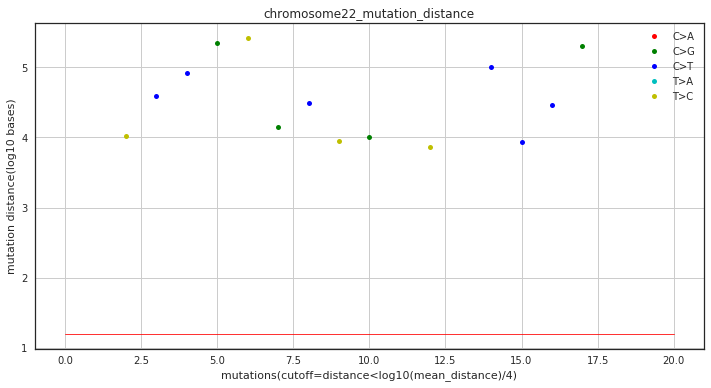

In [44]:
fold_change = 4
for chrm in ['22']:#chromosomes:
    with plt.style.context("seaborn-whitegrid"):
        plt.rcParams["axes.edgecolor"] = "0.15"
        plt.rcParams["axes.linewidth"]  = 1.25
        fig = plt.figure(facecolor='w')
        ax = fig.add_subplot(111)
        
    qdf = tdf.query('chr == "{}"'.format(chrm)).head(20)
    rdf = qdf.groupby(['pos', 'snv2']).chr.count().unstack()
    print(rdf.head())
    snv_positions = qdf.pos.unique()
    snv_positions.sort()
    idxs = rdf.index.tolist()
    print(len(snv_positions), len(idxs))
    assert (snv_positions == idxs).all()
    rdf = rdf.reset_index()
    shifted_positions = shift(snv_positions, 1, cval=np.nan)
    dist = (snv_positions - shifted_positions)[1:]
    avg_distance = np.mean(dist)
    xmax = len(snv_positions)
    threshold = np.log10(avg_distance)/fold_change
    ax.plot((0, xmax), (threshold,threshold), 'r-', linewidth=.8)
    x1 = np.arange(len(dist))
    y1 = np.log10(dist+1)
#     ax.plot(x1, y1, 'w.', markersize=.2)
    
#     plot different types of base changes
    mut_types = rdf.columns.tolist()
    mut_types.remove('pos')
    mut_types
    for k, mtype in enumerate(mut_types):
        sdf = rdf[mtype][1:].to_frame()
        x2 = sdf[sdf[mtype].notnull()].index.tolist()[:-1]
        y2 = y1[x2]
        ax.plot(x2, y2, colors[k], ms=10, label=mtype)
        plt.legend(loc='upper right', markerscale=1)
    plt.title('chromosome{}_mutation_distance'.format(chrm))
    plt.xlabel('mutations(cutoff=distance<log10(mean_distance)/{})'.format(fold_change))
    plt.ylabel('mutation distance(log10 bases)')


    dr = '/projects/trans_scratch/validations/workspace/szong/Cervical/hotspots/test/'
    of = '{0}chromosome{1}_mutation_distance.png'.format(dr, chrm)
#     plt.savefig(of, dpi=200, bbox_inches='tight')
    plt.show()
    plt.close()

# enhancer annotation

In [3]:
genehancer = '/home/szong/Downloads/genehancer.xlsx'
df1 = pd.read_excel(genehancer)

In [21]:
df1.head()

,chrom,source,feature name,start,end,score,strand,frame,attributes
0,chr22,GeneHancer,Enhancer,25191646,25191697,0.27,.,.,genehancer_id=GH22H025191;connected_gene=GC22P...
1,chr10,GeneHancer,Enhancer,36278128,36278746,0.25,.,.,genehancer_id=GH10H036278;connected_gene=GC10M...
2,chr4,GeneHancer,Enhancer,141347800,141349400,1.02,.,.,genehancer_id=GH04H141347;connected_gene=LINC0...
3,chr6,GeneHancer,Enhancer,36141287,36142442,0.36,.,.,genehancer_id=GH06H036141;connected_gene=MAPK1...
4,chr4,GeneHancer,Enhancer,184644792,184651047,1.32,.,.,genehancer_id=GH04H184644;connected_gene=CENPU...


In [30]:
df = df1.drop(['feature name', 'source','strand', 'frame'], axis=1)

In [28]:
df.head()

,chrom,start,end,score,attributes
0,chr22,25191646,25191697,0.27,genehancer_id=GH22H025191;connected_gene=GC22P...
1,chr10,36278128,36278746,0.25,genehancer_id=GH10H036278;connected_gene=GC10M...
2,chr4,141347800,141349400,1.02,genehancer_id=GH04H141347;connected_gene=LINC0...
3,chr6,36141287,36142442,0.36,genehancer_id=GH06H036141;connected_gene=MAPK1...
4,chr4,184644792,184651047,1.32,genehancer_id=GH04H184644;connected_gene=CENPU...


In [31]:
df['enhancerid'] = df.attributes.apply(lambda x: x.split('=')[1].split(';')[0])
df['connected_genes_tmp'] = df.attributes.apply(lambda x: [i.split('=')[1] for i in x.split(';') if 'connected_gene' in i])
df['num_targets'] = df.connected_genes_tmp.apply(lambda x: len(x))
df['connected_genes'] = df['connected_genes_tmp'].apply(lambda x: ';'.join(x))
df = df.drop(['connected_genes_tmp','attributes'], axis=1)
df['chrom'] = df.chrom.str.replace('chr', '')
df.head()

,chrom,start,end,score,enhancerid,num_targets,connected_genes
0,22,25191646,25191697,0.27,GH22H025191,3,GC22P025196;PIR34921;LOC101232810
1,10,36278128,36278746,0.25,GH10H036278,2,GC10M036292;ENSG00000227475
2,4,141347800,141349400,1.02,GH04H141347,4,LINC02432;IL15;ZNF330;ENSG00000250189
3,6,36141287,36142442,0.36,GH06H036141,4,MAPK13;GC06P041162;PIR48318;BRPF3
4,4,184644792,184651047,1.32,GH04H184644,6,CENPU;ACSL1;IRF2;PRIMPOL;CASP3;LINC02365


In [83]:
# df = df.drop('chrom', axis=1)

In [32]:
df = df.sort_values('chrom', ascending=True)

In [33]:
of = '/projects/trans_scratch/validations/workspace/szong/Cervical/hotspots/genehancer_annotation.txt'
df.to_csv(of, index=False, sep='\t')

In [34]:
df.head()

,chrom,start,end,score,enhancerid,num_targets,connected_genes
152724,1,20119401,20119600,0.43,GH01H020119,2,PLA2G2D;LOC100419911
216559,1,193257370,193258002,0.41,GH01H193257,4,B3GALT2;RGS2;PIR40263;LINC01031
233468,1,236905001,236905601,1.28,GH01H236905,6,ENSG00000273058;MTR;ENSG00000230325;HEATR1;LOC...
158329,1,226121001,226126202,1.61,GH01H226121,9,H3F3A;RPL34P7;ACBD3-AS1;MIXL1;SDE2;LIN9;LINC01...
188226,1,237891384,237893029,0.25,GH01H237891,2,ZP4;ENSG00000243781


# length of hotspots

In [93]:
# f10 = '/projects/trans_scratch/validations/workspace/szong/Cervical/hotspots/windows_2x_mutation_rate.h5.txt'
# f10 = '/projects/trans_scratch/validations/workspace/szong/Cervical/hotspots/windowsize_10000_stride_1000_threshold_2x_mutation_rate.h5.txt'
# f10 = '/projects/trans_scratch/validations/workspace/szong/Cervical/hotspots/windowsize_1000_stride_100_threshold_2x_mutation_rate.csv'
f10 = '/projects/trans_scratch/validations/workspace/szong/Cervical/hotspots/windowsize_1000_stride_100_threshold_4x_mutation_rate.h5.repeat'
# f10 = '/projects/trans_scratch/validations/workspace/szong/Cervical/hotspots/windowsize_2000_stride_200_threshold_5x_mutation_rate.h5.repeat'
df10 = pd.read_csv(f10, sep='\t', header=None)
df10.head()

,0,1,2
0,1,9500,11399
1,1,15200,17899
2,1,19100,20999
3,1,65600,67399
4,1,83100,84999


In [94]:
df10['len'] = df10[2] -df10[1]
df10.head()

,0,1,2,len
0,1,9500,11399,1899
1,1,15200,17899,2699
2,1,19100,20999,1899
3,1,65600,67399,1799
4,1,83100,84999,1899


In [95]:
df10.len.sum()/3000000000


0.005160863666666667